<div style="text-align:center"><img src="title.png"/></div>

# Importer librairies

In [1]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
%matplotlib inline


from sklearn import preprocessing
import scipy.stats as scs

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from sklearn import model_selection

from sklearn.cluster import KMeans
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, precision_score, mean_squared_error

import warnings
warnings.filterwarnings('ignore')

In [2]:
#Gestion des options d'affichage 
pd.set_option('display.max_row',1000)
pd.set_option('display.max_columns',50)

# Charger les données

In [3]:
df = pd.read_csv('billets.csv', sep=';')

Informations géométriques sur un billet :<br>
● **length** : la longueur du billet (en mm)<br>
● **height_left** : la hauteur du billet (mesurée sur le côté gauche, en
mm)<br>
● **height_right** : la hauteur du billet (mesurée sur le côté droit, en mm)<br>
● **margin_up** : la marge entre le bord supérieur du billet et l'image de
celui-ci (en mm)<br>
● **margin_low** : la marge entre le bord inférieur du billet et l'image de
celui-ci (en mm) <br>
● **diagonal** : la diagonale du billet (en mm).

In [4]:
df.head()

,is_genuine,diagonal,height_left,height_right,margin_low,margin_up,length
0,True,171.81,104.86,104.95,4.52,2.89,112.83
1,True,171.46,103.36,103.66,3.77,2.99,113.09
2,True,172.69,104.48,103.50,4.40,2.94,113.16
3,True,171.36,103.91,103.94,3.62,3.01,113.51
4,True,171.73,104.28,103.46,4.04,3.48,112.54


# Exploration des données

1 000 billets sont vrais et 500 billets sont faux


In [5]:
print("Nb d'indivus: ",df.shape[0])

Nb d'indivus:  1500


## Information et description

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1500 entries, 0 to 1499
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   is_genuine    1500 non-null   bool   
 1   diagonal      1500 non-null   float64
 2   height_left   1500 non-null   float64
 3   height_right  1500 non-null   float64
 4   margin_low    1463 non-null   float64
 5   margin_up     1500 non-null   float64
 6   length        1500 non-null   float64
dtypes: bool(1), float64(6)
memory usage: 71.9 KB


In [7]:
df.describe()

,diagonal,height_left,height_right,margin_low,margin_up,length
count,1500.000000,1500.000000,1500.000000,1463.000000,1500.000000,1500.00000
mean,171.958440,104.029533,103.920307,4.485967,3.151473,112.67850
std,0.305195,0.299462,0.325627,0.663813,0.231813,0.87273
min,171.040000,103.140000,102.820000,2.980000,2.270000,109.49000
25%,171.750000,103.820000,103.710000,4.015000,2.990000,112.03000
50%,171.960000,104.040000,103.920000,4.310000,3.140000,112.96000
75%,172.170000,104.230000,104.150000,4.870000,3.310000,113.34000
max,173.010000,104.880000,104.950000,6.900000,3.910000,114.44000


S'observe que il n'y a pas des valeurs aberrantes

## Valeurs nulls et uniques

In [8]:
'''
Cette fonction permet de voir les valeurs nulls et uniques dans le df
'''
def voir_uniques_nulls(df):
    print("Valeurs uniques:\n\n",df.nunique() )
    print("_" * 20)
    print("Valeurs nulls:\n\n", df.isnull().sum())

In [9]:
voir_uniques_nulls(df)

Valeurs uniques:

 is_genuine        2
diagonal        159
height_left     155
height_right    170
margin_low      285
margin_up       123
length          336
dtype: int64
____________________
Valeurs nulls:

 is_genuine       0
diagonal         0
height_left      0
height_right     0
margin_low      37
margin_up        0
length           0
dtype: int64


Pour la variable **margin_low** il y a 37 valeurs manquantes

Pourcentage de valeurs nulls pour la variable margin_low:

In [10]:
print( round(df.margin_low.isnull().sum()/df.shape[0] *100,2) ,"%" )

2.47 %


Nous considerons faire une imputation pour conserver les informations des autres variables

## Matrice des corrélations

In [11]:
df.corr(method='pearson')

,is_genuine,diagonal,height_left,height_right,margin_low,margin_up,length
is_genuine,1.000000,0.132756,-0.379833,-0.485092,-0.783032,-0.606262,0.849285
diagonal,0.132756,1.000000,0.019472,-0.024492,-0.111534,-0.055649,0.097587
height_left,-0.379833,0.019472,1.000000,0.242279,0.302643,0.246522,-0.320863
height_right,-0.485092,-0.024492,0.242279,1.000000,0.391085,0.307005,-0.401751
margin_low,-0.783032,-0.111534,0.302643,0.391085,1.000000,0.431606,-0.666753
margin_up,-0.606262,-0.055649,0.246522,0.307005,0.431606,1.000000,-0.520575
length,0.849285,0.097587,-0.320863,-0.401751,-0.666753,-0.520575,1.000000


Les coefficients de Pearson *(r)* montrent plusieures corrélations linéaires assez fortes :

La variable classe **is_genuine** semble être très corrélé avec :

- length  $r = 0.84$
- margin_low $r = -0.78$
- margin_up $ r= -0.60$

**Margin_low** et **margin_up** sont corrélées avec lenght:

- margin_low et length avec $r = -0.66$
- margin_up eet length avec $r = -0.52$

# Traitement de données

## Imputation par la regression linéaire, avec plusieurs valeurs pour representer la réalité

Nous allons définir la variable X pour prédire la variable y "margin_low" qui contient des valeurs manquantes

In [12]:
#Nous allons d'abord définir x_new pour faire la prediction de la variable "margin_low"
new_df= df.loc[df.margin_low.isnull()]

In [13]:
# Récuperer les indexes pour remplacer les valeurs dans la colonne "margin_low"
indx = new_df.index

In [14]:
# Séparer les données où il y a des nulls dans la var "margin_low" pour faire le train et le test
bad_df = df.index.isin(indx)

In [15]:
# Définition de X pour le train et le test
df_rl= df[~bad_df] 

#shape(1463,7) ok pour les nombre des lines

In [16]:
# Définition de X et y pour la reg linéaire
x_rl = df_rl[['diagonal', 'height_left', 'height_right', 'margin_up', 'length']]
y_rl = df_rl['margin_low'][:, np.newaxis] 

In [17]:
#Préparation de le train et le test set
X_train_rl,X_test_rl,y_train_rl,y_test_rl = model_selection.train_test_split (x_rl,y_rl,test_size = 0.2 ,random_state=0)
print (X_train_rl.shape, X_test_rl.shape, y_train_rl.shape, y_test_rl.shape)

(1170, 5) (293, 5) (1170, 1) (293, 1)


In [18]:
# Instanciation du modèle
model_lr = LinearRegression()

In [19]:
model_lr.fit(X_train_rl,y_train_rl)

LinearRegression()

In [20]:
# coefficient de determination, 𝑅², avec .score
r_sq = model_lr.score(X_train_rl, y_train_rl)
print(f"coefficient of determination: {round(r_sq,2)}")


coefficient of determination: 0.48


In [21]:
# Prédictions sur les données existantes
y_pred = model_lr.predict(X_train_rl)

In [22]:
# Prédictions de la variable "margin_low" a partir de nouvelles données 

y_pred_new = model_lr.predict(new_df[['diagonal', 'height_left', 'height_right', 'margin_up', 'length']])
print(f"Nombre de valeurs à remplacer: {len(y_pred_new)}")

Nombre de valeurs à remplacer: 37


In [23]:
# Nous allons remplacer les valeurs nulls avec les 37 prédictions dans la variable "margin_low"

df.loc[indx, 'margin_low'] = np.squeeze(y_pred_new)

In [24]:
#Vérification des valeurs manquantes

print("Nombre des valeurs manquantes après imputation: ", df.margin_low.isnull().sum() )

Nombre des valeurs manquantes après imputation:  0


### Test de normalité 

H0: Les erreurs suivent une loi normal

In [25]:
def calculate_residuals(model, features, label):
    """
    Creates predictions on the features with the model and calculates residuals
    """
    predictions = model.predict(features)
    df_results = pd.DataFrame({'Actual': np.squeeze(label), 'Predicted': np.squeeze(predictions)} , index= features.index)
    df_results['Residuals'] = abs(df_results['Actual']) - abs(df_results['Predicted'])
    
    return df_results


In [26]:
calculate_residuals(model_lr, X_train_rl, y_train_rl)

,Actual,Predicted,Residuals
862,3.44,3.917752,-0.477752
513,4.17,4.290209,-0.120209
61,3.99,4.250184,-0.260184
585,4.04,4.392379,-0.352379
596,4.06,4.465849,-0.405849
...,...,...,...
783,4.48,4.210639,0.269361
858,4.52,4.324716,0.195284
1248,4.60,5.035644,-0.435644
572,4.66,4.169251,0.490749


Nous allons détecter si les erreurs du modele suivent une distribution normal avec l'aide d'un histrograme et la valeur p-value de Test Anderson-Darling

In [27]:
def normal_errors_assumption(model, features, label, p_value_thresh=0.05):
    """
    Normality: Assumes that the error terms are normally distributed. If they are not,
    nonlinear transformations of variables may solve this.
               
    This assumption being violated primarily causes issues with the confidence intervals
    """
    from statsmodels.stats.diagnostic import normal_ad
    print('H0: Les résidus suivent une distribution normal', '\n')
    
    # Calculating residuals for the Anderson-Darling test
    df_results = calculate_residuals(model, features, label)
    
    print('Test Anderson-Darling pour la distribution normal')

    # Performing the test on the residuals
    p_value = normal_ad(df_results['Residuals'])[1]
    print('p-value < 0.05, signifie non-normal:', p_value)
    
    # Reporting the normality of the residuals
    if p_value < p_value_thresh:
        print('Les résidus ne suivent pas une distribution normal')
    else:
        print('Les résidus suivent une distribution normal')
    
    # Plotting the residuals distribution
    plt.subplots(figsize=(12, 6))
    plt.title('Distribution des résidus')
    sns.distplot(df_results['Residuals'])
    plt.show()
    
    print()
    if p_value > p_value_thresh:
        print('Hypothèse accepté')
    else:
        print('Hypothèse rejeté')
        print()
        #print('Confidence intervals will likely be affected')
        #print('Try performing nonlinear transformations on variables')


H0: Les résidus suivent une distribution normal 

Test Anderson-Darling pour la distribution normal
p-value < 0.05, signifie non-normal: 1.4236263265479997e-08
Les résidus ne suivent pas une distribution normal


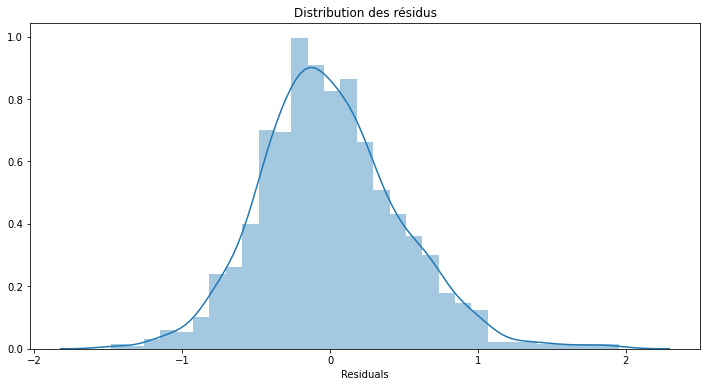


Hypothèse rejeté



In [28]:
normal_errors_assumption(model_lr, X_train_rl, y_train_rl)


### Test d'homoscédasticité des erreurs

Même variance dans nos termes d'erreur. L'hétéroscédasticité, la violation de l'homoscédasticité, se produit lorsque la variance n'est pas la même pour tous les termes d'erreur.

In [29]:
def homoscedasticity_assumption(model, features, label):
    """
    Homoscedasticity: Assumes that the errors exhibit constant variance
    """
    print('H0: Homoscédasticité des résidus', '\n')
    
    print('Les résidus devraient avoir une variance constante')
        
    # Calculating residuals for the plot
    df_results = calculate_residuals(model, features, label)

    # Plotting the residuals
    plt.subplots(figsize=(12, 6))
    ax = plt.subplot(111)  # To remove spines
    plt.scatter(x=df_results.index, y=df_results.Residuals, alpha=0.5)
    plt.plot(np.repeat(0, df_results.index.max()), color='darkorange', linestyle='--')
    ax.spines['right'].set_visible(False)  # Removing the right spine
    ax.spines['top'].set_visible(False)  # Removing the top spine
    plt.title('Residuals')
    plt.show()  

H0: Homoscédasticité des résidus 

Les résidus devraient avoir une variance constante


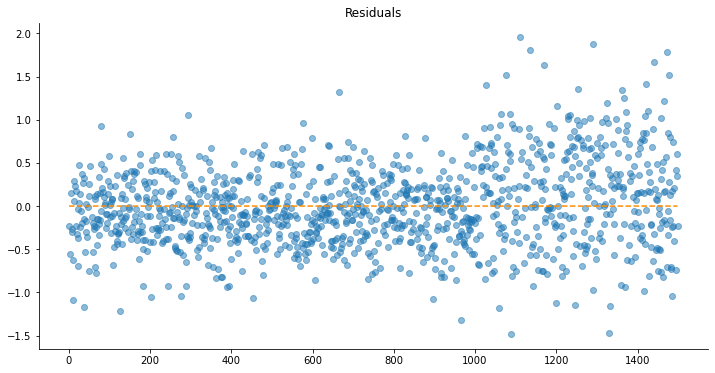

In [30]:
homoscedasticity_assumption(model_lr, X_train_rl, y_train_rl)


### Multicolinéarité entre les prédicteurs

La multicolinéarité suppose que les prédicteurs utilisés dans la régression ne sont pas corrélés entre eux. Cette hypothèse ne rendra pas le modèle inutilisable **si elle n'est pas respectée**, mais elle posera des problèmes d'interprétation du modèle.
Pourquoi cela peut-il arriver ? De nombreuses données sont naturellement corrélées.
Ce qu'elle affecte : La multicolinéarité pose des problèmes d'interprétation des coefficients. Plus précisément, on peux interpréter un coefficient comme "une augmentation de 1 dans ce prédicteur entraîne un changement de (coefficient) dans la variable réponse, en maintenant tous les autres prédicteurs constants". Cela devient problématique en cas de multicolinéarité, car nous ne pouvons pas maintenir constants les prédicteurs corrélés. En outre, cela augmente l'erreur standard des coefficients, ce qui a pour effet de les faire apparaître comme statistiquement non significatifs alors qu'ils pourraient l'être en réalité.


In [31]:
def multicollinearity_assumption(model, features, label, feature_names=None):
    """
    Multicollinearity: Assumes that predictors are not correlated with each other. If there is
                       correlation among the predictors, then either remove prepdictors with high
                       Variance Inflation Factor (VIF) values or perform dimensionality reduction
                           
                       This assumption being violated causes issues with interpretability of the 
                       coefficients and the standard errors of the coefficients.
    """
    from statsmodels.stats.outliers_influence import variance_inflation_factor
    print('H0: Peu ou pas de multicolinéarité entre les prédicteurs')
        
    # Plotting the heatmap
    plt.figure(figsize = (10,8))
    sns.heatmap(pd.DataFrame(features, columns=feature_names).corr(), annot=True)
    plt.title('Correlation de Variables')
    plt.show()
        
    print('Variance Inflation Factors (VIF)')
    print("> 10: Indication de l'existence possible d'une multicolinéarité")
    print('> 100: Une certaine multicolinéarité entre les variables')
    print('-------------------------------------')
       
    # Gathering the VIF for each variable
    VIF = [variance_inflation_factor(features.values, i) for i in range(features.shape[1] )]
    for idx, vif in enumerate(VIF):
        print('{0}: {1}'.format(feature_names[idx], vif))
        
    # Gathering and printing total cases of possible or definite multicollinearity
    possible_multicollinearity = sum([1 for vif in VIF if vif > 10])
    definite_multicollinearity = sum([1 for vif in VIF if vif > 100])
    print()
    print('{0} cas de multicolinéarité possible'.format(possible_multicollinearity))
    print('{0} cas de multicolinéarité certaine'.format(definite_multicollinearity))
    print()

    if definite_multicollinearity == 0:
        if possible_multicollinearity == 0:
            print('Hypothèse acceptée')
        else:
            print('Hypothèse éventuellement satisfait')
            print()
            print("L'interprétabilité des coefficients peut être problématique")
            #print('Consider removing variables with a high Variance Inflation Factor (VIF)')

    else:
        print('Hypothèse rejetée')
        print()
        print("L'interprétabilité des coefficients peut être problématique")
        #print('Consider removing variables with a high Variance Inflation Factor (VIF)')


In [32]:
# Variables de X
linear_feature_names = X_train_rl.columns

H0: Peu ou pas de multicolinéarité entre les prédicteurs


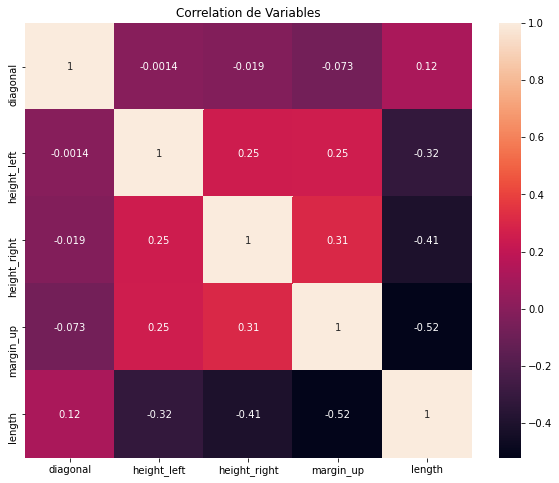

Variance Inflation Factors (VIF)
> 10: Indication de l'existence possible d'une multicolinéarité
> 100: Une certaine multicolinéarité entre les variables
-------------------------------------
diagonal: 170791.4373017249
height_left: 109902.97478125882
height_right: 102457.15801112131
margin_up: 261.06622573219903
length: 23589.104582871358

5 cas de multicolinéarité possible
5 cas de multicolinéarité certaine

Hypothèse rejetée

L'interprétabilité des coefficients peut être problématique


In [33]:
multicollinearity_assumption(model_lr, X_train_rl, y_train_rl, linear_feature_names)

## Vérification d'outliers

In [34]:
x= df.loc[:, df.columns != 'is_genuine']

In [35]:
x.shape

(1500, 6)

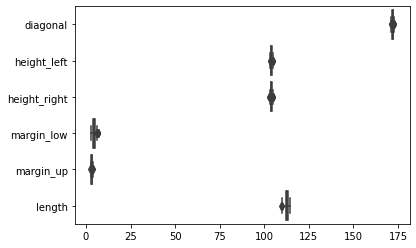

In [36]:
sns.boxplot(data = x, orient='h')
plt.rcParams["figure.dpi"] = 500

On observe que les distributions pour la hauteur du billet (mesurée sur le côté gauche et côté droit, en mm) sont autour de 100. Egalement pour les distributions des variables la marge entre le bord supérieur et inférieur du billet et l'image de celui-ci (en mm) les valuers sont logiques.

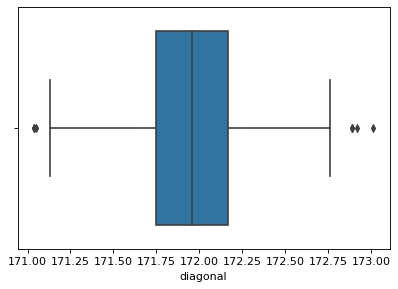

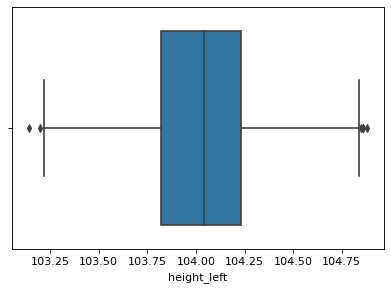

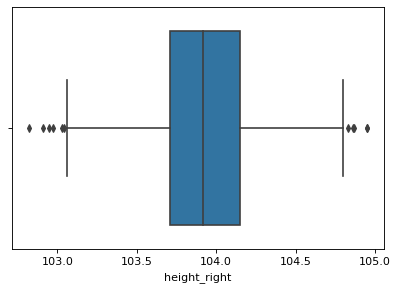

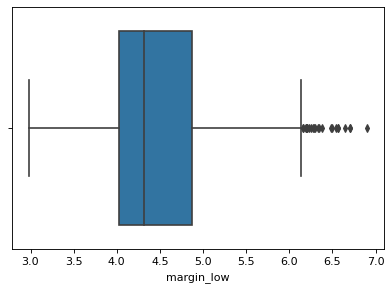

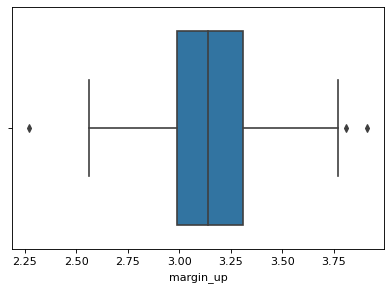

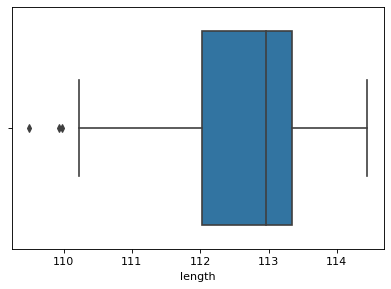

In [37]:
for c in x.columns:
    figure(figsize=(6, 4), dpi=80)
    sns.boxplot(x=df[c])
    plt.show()

Nous allons afficher les individus identifiés comme outliers

In [38]:
# Récuperer le nombre d'outliers et le df outliers pour chaque variable
def outliers(df, col):
    q1, q3 = np.percentile(col, [25, 75])
    iqr = q3 - q1
    lower_bound = q1 - 1.5*iqr
    upper_bound = q3 + 1.5*iqr
    #create conditions to isolate the outliers
    outliers = df[ (col > upper_bound) | (col < lower_bound) ]
    nb_out = outliers.shape[0]
    
    return  nb_out , outliers

In [39]:
outliers(df, df.diagonal)
# Nb outliers : 7

(7,
       is_genuine  diagonal  height_left  height_right  margin_low  margin_up  \
 729         True    171.04       103.84        103.64        4.22       3.36   
 828         True    172.92       103.55        103.94        4.78       3.27   
 842         True    172.89       103.77        104.24        4.12       3.01   
 1022       False    172.89       104.03        104.03        6.03       3.00   
 1142       False    171.04       104.23        104.22        4.87       3.56   
 1277       False    173.01       104.59        104.31        5.04       3.05   
 1388       False    171.05       104.09        104.50        4.72       3.10   
 
       length  
 729   112.70  
 828   113.55  
 842   113.72  
 1022  110.95  
 1142  111.54  
 1277  110.91  
 1388  112.44  )

In [40]:
outliers(df, df.height_left)
# Nb outliers : 6

(6,
       is_genuine  diagonal  height_left  height_right  margin_low  margin_up  \
 0           True    171.81       104.86        104.95        4.52       2.89   
 224         True    172.12       103.20        103.92        4.46       3.26   
 292         True    172.09       103.14        103.81        4.88       3.01   
 1090       False    172.11       104.88        104.10        4.80       3.73   
 1150       False    171.79       104.86        104.34        5.39       3.14   
 1382       False    171.97       104.85        104.52        5.87       3.56   
 
       length  
 0     112.83  
 224   113.44  
 292   113.69  
 1090  110.78  
 1150  113.02  
 1382  110.98  )

In [41]:
outliers(df, df.height_right)
# Nb outliers : 11

(11,
       is_genuine  diagonal  height_left  height_right  margin_low  margin_up  \
 0           True    171.81       104.86        104.95    4.520000       2.89   
 77          True    171.84       104.09        103.03    4.110000       2.77   
 176         True    171.75       103.63        102.97    4.460000       2.77   
 193         True    172.35       103.73        102.95    4.490000       3.37   
 251         True    171.80       103.26        102.82    3.812217       2.95   
 522         True    172.02       104.42        102.91    3.860000       3.12   
 761         True    172.16       103.93        103.04    4.140000       2.99   
 1199       False    172.03       104.32        104.87    4.490000       3.77   
 1321       False    172.29       104.72        104.86    5.710000       3.16   
 1331       False    172.32       104.60        104.83    4.840000       3.51   
 1484       False    172.08       103.96        104.95    5.220000       3.45   
 
       length  
 0   

In [42]:
outliers(df, df.margin_low)
# Nb outliers : 24

(24,
       is_genuine  diagonal  height_left  height_right  margin_low  margin_up  \
 1023       False    172.02       104.26        104.20        6.20       3.58   
 1027       False    171.63       104.02        104.66        6.70       3.28   
 1031       False    172.40       104.00        103.82        6.33       3.10   
 1041       False    171.77       104.12        104.42        6.65       3.63   
 1053       False    171.85       104.52        104.05        6.21       3.43   
 1075       False    172.02       104.51        103.69        6.23       3.39   
 1092       False    171.87       104.76        104.02        6.30       3.61   
 1110       False    171.73       104.32        104.07        6.56       3.30   
 1124       False    171.88       103.92        104.27        6.70       3.11   
 1133       False    171.79       103.99        103.67        6.16       3.52   
 1134       False    171.91       103.70        104.41        6.34       3.50   
 1169       False    17

In [43]:
outliers(df, df.margin_up)
# Nb outliers : 3

(3,
       is_genuine  diagonal  height_left  height_right  margin_low  margin_up  \
 664         True    172.05       103.70        103.75        5.04       2.27   
 1029       False    171.96       104.29        104.03        6.01       3.91   
 1270       False    171.26       104.22        104.07        4.78       3.81   
 
       length  
 664   113.55  
 1029  110.83  
 1270  112.88  )

In [44]:
nb_outli, _ = outliers(df, df.length)
# Nb outliers : 3

In [45]:
cols= df.columns[1:]
total_out = 0
for var in cols:
    nb_out, _ = outliers(df, df[var])
    total_out += nb_out   
    
print("Nombre total d'outliers:" ,total_out)

Nombre total d'outliers: 54


Nous allons garder tous les outliers car il y 37 faux billets parmis les 54 outliers. Cette information peux aider a choisir les faux billets.

In [46]:
print('Represente un ',round(37/ 500*100,2),'% dans la totalité des faux billets (500)') 

Represente un  7.4 % dans la totalité des faux billets (500)


# Répartition de vrais et faux billets

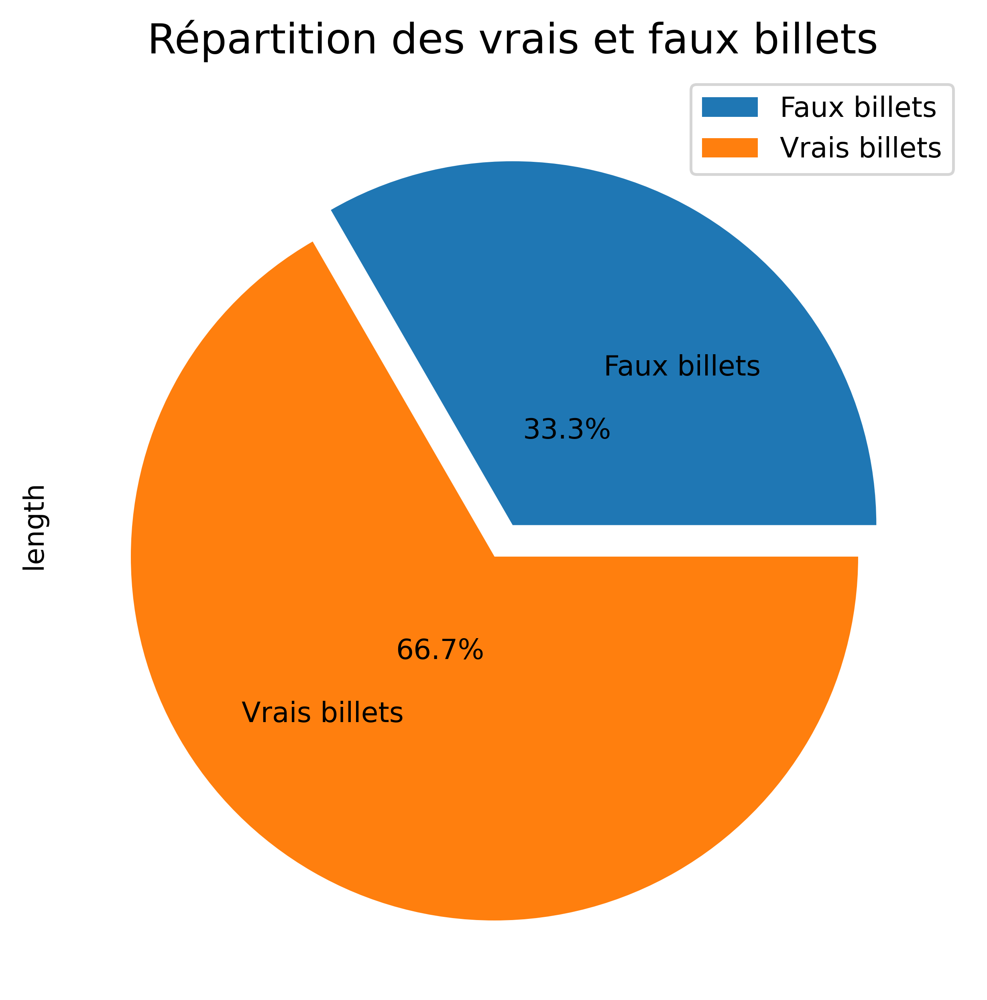

In [47]:
data = df.groupby("is_genuine").count()
data.plot.pie(y="length",figsize=(6, 6),
                                explode = [0, 0.1],
                                labels = ["Faux billets", "Vrais billets"],
                                autopct = '%1.1f%%',
                                pctdistance = 0.3, labeldistance = 0.5)

plt.title('Répartition des vrais et faux billets', 
  loc='center', 
  fontsize=15)
#plt.savefig('graph/DESCRIBE_repartition_vrai_faux.png')
plt.show()

In [48]:
data

,diagonal,height_left,height_right,margin_low,margin_up,length
is_genuine,,,,,,
False,500,500,500,500,500,500
True,1000,1000,1000,1000,1000,1000


Les classes ne sont pas équilibrées, a prendre en compte  pour l'algorithme de classification

# Distribution de chaque variable

## Graphiques

In [49]:
def var_hist(var, i):
    subset = x[var]
    n_dataset = len(x)
    xbar = np.mean(x[var]) # Moyenne
    sprime = np.std(x[var], ddof=1) # Ecart-type
    sprime2 = np.var(x[var], ddof=1) #Variance non biaisée
    ax = fig.add_subplot(i)
    ax.hist(subset, density=True)
    ax.axvline(xbar, color='r', linewidth=2, label="Moyenne empirique")
    bins = np.arange(x[var].min(),x[var].max(),0.05)
    y = scs.norm.pdf(bins, xbar, sprime)
    ax.plot(bins, y, '--', label="Densité normale")
    ax.legend()
    ax.set_xlabel(var, fontsize=12)
    ax.set_ylabel('Densité', fontsize=12)
    ax.set_title('Distribution de '+str(var), fontsize=18)


In [50]:
liste_var= list(x.columns)

In [51]:

fig = plt.figure(figsize=(20,30),constrained_layout=False)
i = 321
for var in liste_var :
    var_hist(var, i)
    i+=1
#fig.savefig('graph/DESCRIBE_distributions_variables_1.png')


## Test d'adéquation - loi normale

In [52]:
liste_var = liste_var
for var in liste_var :
    print(var,":",scs.ks_2samp(df[var],#.ks_2samp() pour un test à deux échantillons.
                               list(np.random.normal(np.mean(df[var]), np.std(df[var]), 1000))))

diagonal : KstestResult(statistic=0.035, pvalue=0.4472689969866832)
height_left : KstestResult(statistic=0.034666666666666665, pvalue=0.45950911988860554)
height_right : KstestResult(statistic=0.03233333333333333, pvalue=0.5495684317603884)
margin_low : KstestResult(statistic=0.15933333333333333, pvalue=9.536815781530095e-14)
margin_up : KstestResult(statistic=0.04666666666666667, pvalue=0.1433663848912069)
length : KstestResult(statistic=0.162, pvalue=3.419486915845482e-14)


Le test de Kolmogorov-Smirnov est utilisé pour tester si un échantillon provient ou non d’une certaine distribution. Dans ce cas il montre que pour les variables margin_low et length ne suivent pas une loi normal, ce que se montre aussi dans les histrogrames

# Analyse bivarie

## Pairplots

In [53]:
sns.set(style="ticks")
sns.pairplot(df[["height_left","height_right","margin_low","margin_up","length","diagonal","is_genuine"]], hue="is_genuine")
#plt.savefig('graph/DESCRIBE_pairplots.png')
plt.show()

On retrouve ces corrélations sur les graphs ci-dessus. En réalisant ce pairplot avec la séparation de couleurs entre vrais et faux billets, **on remarque bien 2 groupes distincts pour chacune des variables**, qui permettent certainement de différencier les billets falcifiés.

## Boxplots de répartition des variables en fonction de la classe is_genuine

In [54]:
def var_boxplot(var, i):
    ax = fig.add_subplot(i)
    ax = sns.boxplot(x="is_genuine", y=var, data=df)
    plt.xlabel('Vrai / faux billet')
    plt.ylabel(var)
    plt.title('Variable '+str(var)+' en fonction du type de billet', color="blue", size=16)

liste_var = ["height_left","height_right","margin_low","margin_up","length","diagonal"]

fig = plt.figure(figsize=(20,30),constrained_layout=False)
i = 321
for var in liste_var :
    var_boxplot(var, i)
    i+=1
#fig.savefig('graph/DESCRIBE_Boxplot_variables_1.png')

On remarque que les médiannes de vrais et faux billets sont diférentes entre elles. Pour la variable diagonal, la médianne s'apprenchent.

Rappel: la variance est le quarré de la desviation standar.
    «Desviation»: fait réference a la distance depuis la media.
    “Standar”: fait réference a la distance “standar” o “tipique” entre une valeur et la media.

# ACP

In [55]:
# Je recupere les données sans la classe
acp_df = df.iloc[:, 1:]

In [56]:
#nombre d'observations 
n = acp_df.shape[0] 
#nombre de variables / dimenssions
p = acp_df.shape[1]

In [57]:
#instanciation 
sc = StandardScaler() 

#transformation – centrage-réduction 
Z = sc.fit_transform(acp_df) 
print(Z)

[[-0.48653957  2.77412327  3.16324041  0.05554229 -1.128325    0.17365114]
 [-1.63372936 -2.23653528 -0.79966777 -1.08188142 -0.69679916  0.47166629]
 [ 2.3978233   1.50475644 -1.29119126 -0.12644551 -0.91256208  0.55190114]
 ...
 [-0.51931643 -0.06524991  0.61346228  1.55694159  0.89984645 -0.83501554]
 [ 0.3328817   0.83666863  0.42914097  1.0413095   1.33137229 -0.4911519 ]
 [-1.6009525   0.40241156 -0.30814427  0.22236443  0.94299904 -0.69747008]]


In [58]:
#instanciation de l'ACP 
acp = PCA(svd_solver='full')
print(acp)

PCA(svd_solver='full')


In [59]:
#calculs des coordonnées factorielles dans la variable coord 
coord = acp.fit_transform(Z) 

In [60]:
# Transformation en DataFrame pandas
projected_df = pd.DataFrame({
    "Dim1" : coord[:,0], 
    "Dim2" : coord[:,1],
    "is_genuine" : df["is_genuine"]
})

# Résultat (premières lignes)
projected_df.head()

,Dim1,Dim2,is_genuine
0,1.643817,0.748834,True
1,-2.019652,-2.207710,True
2,-0.970075,2.620254,True
3,-1.377312,-1.818045,True
4,0.148949,-0.566446,True


In [61]:
projected_df.shape

(1500, 3)

In [62]:
print("nombre de composantes calculées:", acp.n_components_)

nombre de composantes calculées: 6


In [63]:
#variance expliquée 
valprop = acp.explained_variance_
print(valprop)

[2.59917446 1.01811047 0.78206798 0.71000366 0.57600661 0.31863949]


In [64]:
#proportion de variance expliquée 

valprop_ratio = acp.explained_variance_ratio_
print(valprop_ratio)

[0.43290695 0.16957195 0.13025777 0.11825505 0.0959371  0.05307118]


In [65]:
var_expl = pd.DataFrame(
    {
        "Dimension" : ["Dim" + str(x + 1) for x in range(6)], 
        "Variance expliquée" : acp.explained_variance_,
        "% variance expliquée" : np.round(acp.explained_variance_ratio_ * 100),
        "% cum. var. expliquée" : np.round(np.cumsum(acp.explained_variance_ratio_) * 100)
    }
)

var_expl


,Dimension,Variance expliquée,% variance expliquée,% cum. var. expliquée
0,Dim1,2.599174,43.0,43.0
1,Dim2,1.018110,17.0,60.0
2,Dim3,0.782068,13.0,73.0
3,Dim4,0.710004,12.0,85.0
4,Dim5,0.576007,10.0,95.0
5,Dim6,0.318639,5.0,100.0


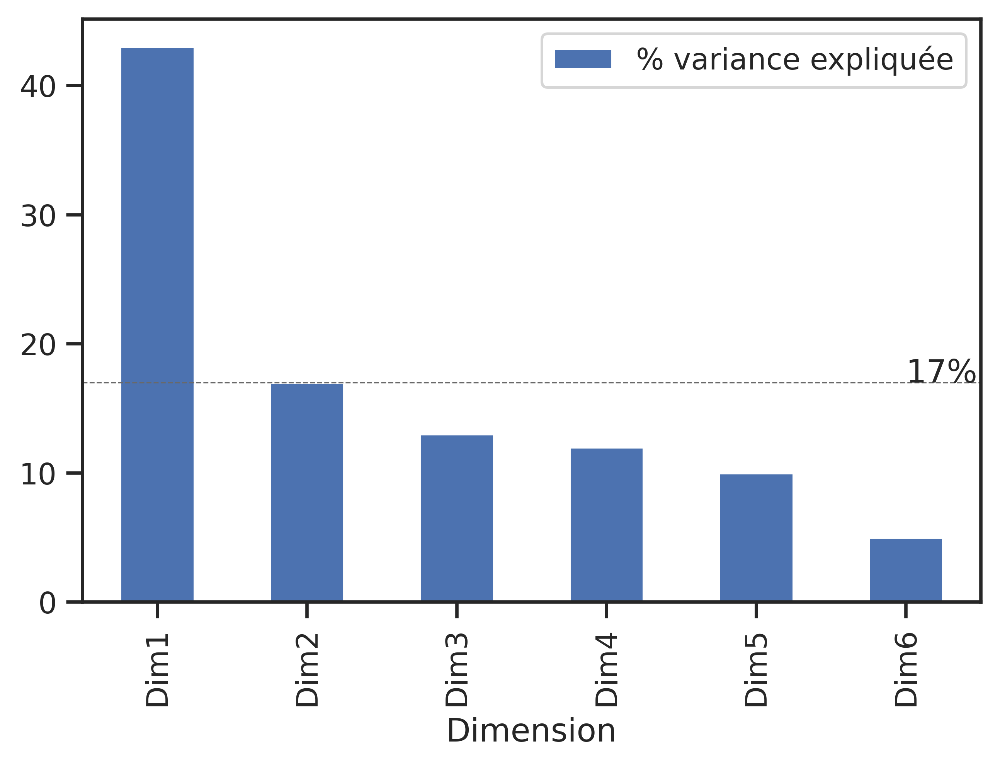

In [66]:
var_expl.plot.bar(x = "Dimension", y = "% variance expliquée") # permet un diagramme en barres
plt.text(5, 17, "17%") # ajout de texte
plt.axhline(y = 17, linewidth = .5, color = "dimgray", linestyle = "--") # ligne 14 = 100 / 7 (nb dimensions)
plt.show()

## Cercle de corrélations

In [67]:
#n = df_5_vars.shape[0] # nb individus
#p = df_5_vars.shape[1] # nb variables
eigval = (n-1) / n * acp.explained_variance_ # valeurs propres
sqrt_eigval = np.sqrt(eigval) # racine carrée des valeurs propres
corvar = np.zeros((p,p)) # matrice vide pour avoir les coordonnées
for k in range(p):
    corvar[:,k] = acp.components_[k,:] * sqrt_eigval[k]
# on modifie pour avoir un dataframe
coordvar = pd.DataFrame({'id': acp_df.columns, 'COR_1': corvar[:,0], 'COR_2': corvar[:,1]})
coordvar


,id,COR_1,COR_2
0,diagonal,-0.136604,0.949375
1,height_left,0.532757,0.310394
2,height_right,0.634220,0.109435
3,margin_low,0.818275,-0.073337
4,margin_up,0.708377,-0.004939
5,length,-0.849320,0.048949


In [68]:
def correlation_graph(pca, 
                      x_y, 
                      features) : 
    """Affiche le graphe des correlations

    Positional arguments : 
    -----------------------------------
    pca : sklearn.decomposition.PCA : notre objet PCA qui a été fit
    x_y : list ou tuple : le couple x,y des plans à afficher, exemple [0,1] pour F1, F2
    features : list ou tuple : la liste des features (ie des dimensions) à représenter
    """

    # Extrait x et y 
    x,y=x_y

    # Taille de l'image (en inches)
    fig, ax = plt.subplots(figsize=(8, 7))

    # Pour chaque composante : 
    for i in range(0, pca.components_.shape[1]):

        # Les flèches
        ax.arrow(0,0, 
                pca.components_[x, i],  
                pca.components_[y, i],  
                head_width=0.07,
                head_length=0.07, 
                width=0.02, )

        # Les labels
        plt.text(pca.components_[x, i] + 0.05,
                pca.components_[y, i] + 0.05,
                features[i])
        
    # Affichage des lignes horizontales et verticales
    plt.plot([-1, 1], [0, 0], color='grey', ls='--')
    plt.plot([0, 0], [-1, 1], color='grey', ls='--')

    # Nom des axes, avec le pourcentage d'inertie expliqué
    plt.xlabel('F{} ({}%)'.format(x+1, round(100*pca.explained_variance_ratio_[x],1)))
    plt.ylabel('F{} ({}%)'.format(y+1, round(100*pca.explained_variance_ratio_[y],1)))

    # J'ai copié collé le code sans le lire
    plt.title("Cercle des corrélations (F{} et F{})".format(x+1, y+1))

    # Le cercle 
    an = np.linspace(0, 2 * np.pi, 100)
    plt.plot(np.cos(an), np.sin(an))  # Add a unit circle for scale

    # Axes et display
    plt.axis('equal')
    plt.show(block=False)

In [69]:
x_y = (0,1)
x_y

(0, 1)

In [70]:
features = coordvar["id"]

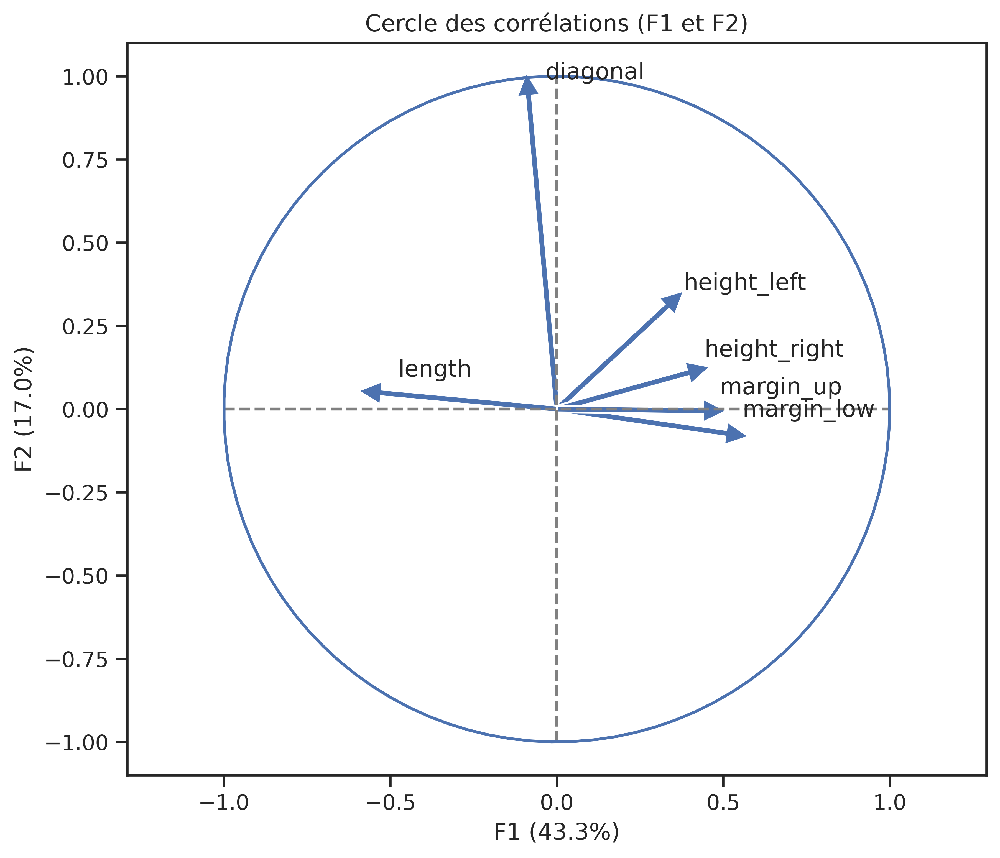

In [71]:
correlation_graph(acp, x_y, features)

## Projection des individus sur F1 et F2

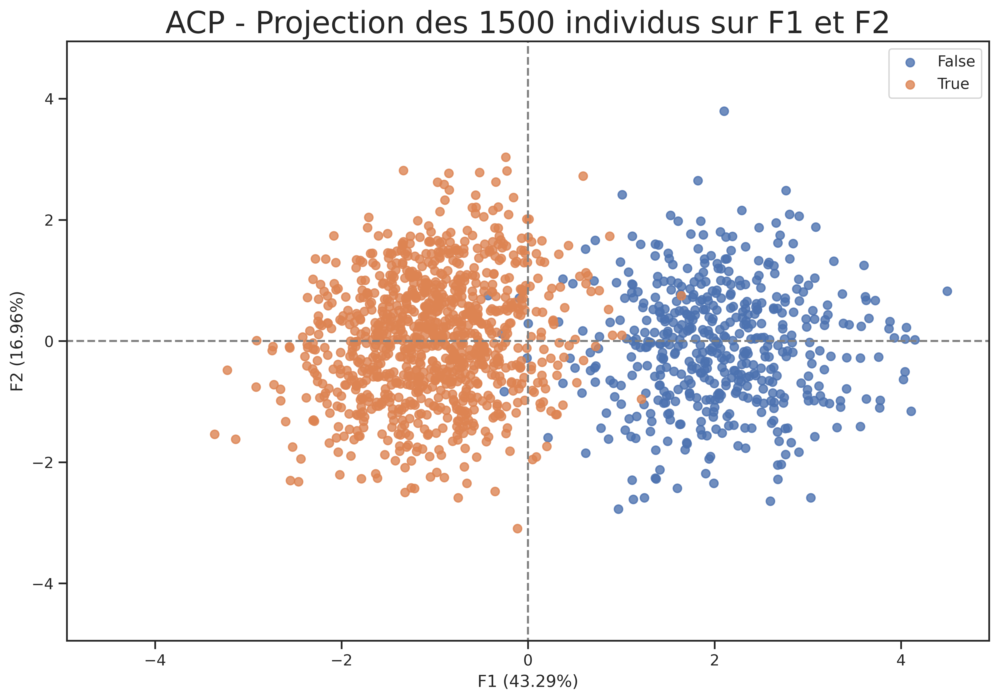

In [72]:
# initialisation de la figure       
fig = plt.figure(figsize=(12,8))

# Affichage des points et variable illustrative
illustrative_var = np.array(df['is_genuine'].values)
for value in np.unique(illustrative_var):
    selected = np.where(illustrative_var == value)
    plt.scatter(coord[selected, 0], coord[selected, 1], alpha=0.8, label=value)
    plt.legend()

# affichage des labels des points
#for i,(x,y) in enumerate(coord[:,[0,1]]):
 #   plt.text(x, y, acp_df.index[i], fontsize='14', ha='center',va='center')
    
# détermination des limites du graphique
boundary = np.max(np.abs(coord[:, [0,1]])) * 1.1
plt.xlim([-boundary,boundary])
plt.ylim([-boundary,boundary])
        
# affichage des lignes horizontales et verticales
plt.plot([-100, 100], [0, 0], color='grey', ls='--')
plt.plot([0, 0], [-100, 100], color='grey', ls='--')

# nom des axes, avec le pourcentage d'inertie expliqué
plt.xlabel('F1 ({}%)'.format(round(100*valprop_ratio[0],2)))
plt.ylabel('F2 ({}%)'.format(round(100*valprop_ratio[1],2)))

plt.title("ACP - Projection des {} individus sur F1 et F2".format(coord.shape[0]), fontsize=22)
plt.show(block=False)

# Algorithmes de prédiction

## Kmeans

Nous allons travailler avec les deux dimensions de l'ACP

In [73]:
data= projected_df[['Dim1','Dim2']]

In [74]:
kmeans2 = KMeans(n_clusters = 2, random_state= 3)
kmeans2.fit(data)

KMeans(n_clusters=2, random_state=3)

In [75]:
pd.Series(kmeans2.labels_).value_counts()

1    997
0    503
dtype: int64

In [76]:
#Centroides
centers = kmeans2.cluster_centers_
centers

array([[ 2.04253601, -0.066344  ],
       [-1.03357244,  0.03357166]])

### Clusters

In [77]:
#Récupération des clusters attribués à chaque individu
clusters_km = kmeans2.labels_
clusters_km

array([0, 1, 1, ..., 0, 0, 0], dtype=int32)

In [78]:
df['Cluster'] = clusters_km

In [79]:
# Affichage de 10 individus
df.sample(10)

,is_genuine,diagonal,height_left,height_right,margin_low,margin_up,length,Cluster
1019,False,172.16,104.03,104.44,5.33,3.33,111.21,0
1145,False,171.79,103.81,103.97,5.86,3.20,111.04,0
663,True,171.80,103.78,103.65,3.73,3.12,113.63,1
186,True,172.21,103.48,104.04,4.40,3.00,113.15,1
1343,False,171.62,104.14,104.45,4.94,3.66,111.93,0
642,True,171.85,103.90,103.74,4.13,3.07,113.15,1
1299,False,172.11,104.24,104.06,5.61,3.60,111.76,0
2,True,172.69,104.48,103.50,4.40,2.94,113.16,1
836,True,172.52,103.98,103.74,4.66,3.19,113.44,1
343,True,171.70,103.77,103.88,4.10,2.96,112.91,1


### Projection sur le plan factoriel

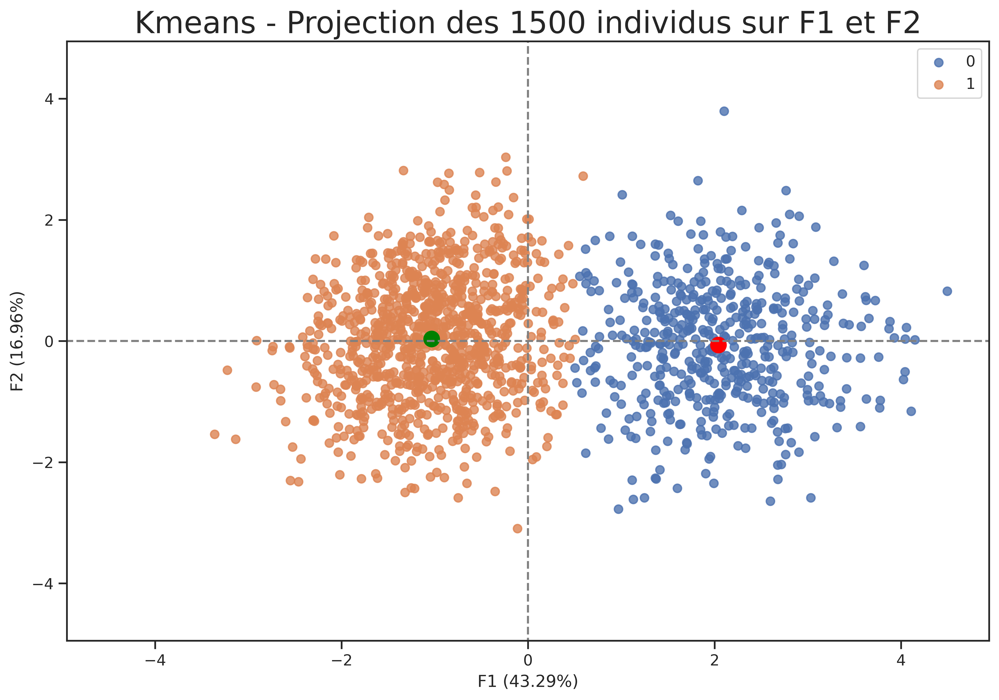

In [80]:
# initialisation de la figure       
fig = plt.figure(figsize=(12,8))

# Affichage des points et variable illustrative
illustrative_var = np.array(df['Cluster'].values)
for value in np.unique(illustrative_var):
    selected = np.where(illustrative_var == value)
    plt.scatter(coord[selected, 0], coord[selected, 1], alpha=0.8, label=value)# label affiche 0 et 1
    plt.legend()

#Affichage de centroides
plt.scatter(centers[:,0] , centers[:,1] , marker = "o", s=50,linewidths = 5,
            c=['red','green'])

# affichage des labels des points
#for i,(x,y) in enumerate(coord[:,[0,1]]):
 #   plt.text(x, y, df.index[i], fontsize='14', ha='center',va='center')
    
#Affichage des points différents
#for ind in df_diff.iterrows():
 #   plt.scatter(coord[ind[0],0], coord[ind[0],1], alpha=1, marker="D", s=100, color="r")
      
# détermination des limites du graphique
boundary = np.max(np.abs(coord[:, [0,1]])) * 1.1
plt.xlim([-boundary,boundary])
plt.ylim([-boundary,boundary])
        
# affichage des lignes horizontales et verticales
plt.plot([-100, 100], [0, 0], color='grey', ls='--')
plt.plot([0, 0], [-100, 100], color='grey', ls='--')

# nom des axes, avec le pourcentage d'inertie expliqué
plt.xlabel('F1 ({}%)'.format(round(100*valprop_ratio[0],2)))
plt.ylabel('F2 ({}%)'.format(round(100*valprop_ratio[1],2)))

plt.title("Kmeans - Projection des {} individus sur F1 et F2".format(coord.shape[0]), fontsize=22)
plt.show(block=False)

# 0 --False
# 1 -- True

In [81]:
# Repérer le Cluster kmeans correspondant à is_genuine = False
cross_kmeans = pd.crosstab(df['Cluster'], df['is_genuine']).reset_index()
cluster_false = cross_kmeans[cross_kmeans[False] > cross_kmeans[True]].Cluster

In [82]:
#affichage des différences
df_diff = df[((df['is_genuine'] == True) & (df['Cluster'] == int(cluster_false))) | ((df['is_genuine'] == False) & (df['Cluster'] != int(cluster_false)))]
df_diff
# 27 individus

,is_genuine,diagonal,height_left,height_right,margin_low,margin_up,length,Cluster
0,True,171.81,104.86,104.95,4.520000,2.89,112.83,0
253,True,172.07,104.33,104.33,4.410000,3.39,113.39,0
341,True,171.90,104.21,104.21,4.770000,3.38,113.20,0
580,True,171.76,104.48,104.01,4.350000,3.37,113.09,0
626,True,171.98,104.44,104.08,4.670000,3.21,112.73,0
661,True,171.69,104.22,104.62,4.110000,3.25,113.40,0
669,True,172.14,104.34,104.20,4.630000,3.02,112.47,0
724,True,172.16,104.43,104.06,4.510000,3.19,112.69,0
728,True,171.94,104.11,104.16,4.080000,3.35,111.76,0
743,True,172.30,104.58,104.17,4.360000,3.33,112.98,0


### Marge d'erreur

In [83]:
print("Nous avons une marge d'erreur de",round((df_diff.shape[0]/n)*100,2),"% sur",n,"individus.")

Nous avons une marge d'erreur de 1.8 % sur 1500 individus.


##  Regresion logistique

In [84]:
df = df[['is_genuine', 'diagonal', 'height_left', 'height_right', 'margin_low',
       'margin_up', 'length']]

In [85]:
df.head()

,is_genuine,diagonal,height_left,height_right,margin_low,margin_up,length
0,True,171.81,104.86,104.95,4.52,2.89,112.83
1,True,171.46,103.36,103.66,3.77,2.99,113.09
2,True,172.69,104.48,103.50,4.40,2.94,113.16
3,True,171.36,103.91,103.94,3.62,3.01,113.51
4,True,171.73,104.28,103.46,4.04,3.48,112.54


In [86]:
# Transformer la classe en 0 (vrais) et 1 (faux)
df['is_genuine'] = df['is_genuine'].apply(lambda x: 0 if x == True else 1)

In [87]:
df['is_genuine'] = df["is_genuine"].astype('category')

Sans equilibrer les données 33.3 % vs 67.7%

Nous allons définir X (features) et y (target).

In [88]:
X = df.select_dtypes(np.number)
y = df["is_genuine"].cat.codes # cat --> category

### Partition des donées

Nous allons partionner les données avec la méthode train_test_split. Nous prenos 80% des données pour l'entrainement du model et 20% des données pour le tester.

In [89]:
X_train,X_test,y_train,y_test = model_selection.train_test_split (X,y,test_size = 0.2 ,random_state=0)
print (X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(1200, 6) (300, 6) (1200,) (300,)


### Modele

In [90]:
#regression logistique
lr = LogisticRegression()

#modélisation sur les données d'apprentissage
modele = lr.fit(X_train, y_train)

In [91]:
modele

LogisticRegression()

### Probabilités sur les donées de test.

In [92]:
probs = lr.predict_proba(X_test[["diagonal","height_left","height_right","margin_low","margin_up","length"]])
probs

array([[9.77656575e-01, 2.23434246e-02],
       [9.95057268e-01, 4.94273219e-03],
       [1.40418335e-01, 8.59581665e-01],
       [9.10269669e-01, 8.97303306e-02],
       [4.51397237e-05, 9.99954860e-01],
       [6.22892359e-03, 9.93771076e-01],
       [9.27488650e-01, 7.25113498e-02],
       [9.94111159e-01, 5.88884137e-03],
       [9.99279378e-01, 7.20622432e-04],
       [8.22698298e-03, 9.91773017e-01],
       [8.65727403e-04, 9.99134273e-01],
       [1.18985740e-05, 9.99988101e-01],
       [2.23152550e-03, 9.97768474e-01],
       [9.89991630e-01, 1.00083695e-02],
       [9.99292443e-01, 7.07556670e-04],
       [9.98797766e-01, 1.20223372e-03],
       [2.78423346e-03, 9.97215767e-01],
       [2.27139243e-03, 9.97728608e-01],
       [9.99775479e-01, 2.24521123e-04],
       [1.15216281e-02, 9.88478372e-01],
       [9.99606301e-01, 3.93698692e-04],
       [9.99886829e-01, 1.13170662e-04],
       [9.96694994e-01, 3.30500572e-03],
       [9.69455158e-01, 3.05448415e-02],
       [6.397980

In [93]:
prob_faux = probs[:,1]
prob_faux

array([2.23434246e-02, 4.94273219e-03, 8.59581665e-01, 8.97303306e-02,
       9.99954860e-01, 9.93771076e-01, 7.25113498e-02, 5.88884137e-03,
       7.20622432e-04, 9.91773017e-01, 9.99134273e-01, 9.99988101e-01,
       9.97768474e-01, 1.00083695e-02, 7.07556670e-04, 1.20223372e-03,
       9.97215767e-01, 9.97728608e-01, 2.24521123e-04, 9.88478372e-01,
       3.93698692e-04, 1.13170662e-04, 3.30500572e-03, 3.05448415e-02,
       9.99936020e-01, 1.64694796e-02, 9.94762595e-01, 4.47040063e-02,
       4.61934385e-02, 9.99254055e-01, 9.91547049e-01, 5.76639557e-03,
       9.99166449e-01, 1.75662811e-03, 9.81354201e-01, 9.87003192e-01,
       1.15384134e-03, 1.26389265e-01, 5.65475733e-03, 3.07907973e-03,
       9.97425509e-01, 9.99659668e-01, 9.85075016e-01, 1.63364546e-01,
       1.04707782e-02, 2.07691365e-04, 2.21960823e-01, 1.17188578e-03,
       1.90868276e-03, 8.89133781e-01, 5.06779842e-03, 9.99674437e-01,
       1.56177816e-03, 9.42006037e-01, 4.81211775e-04, 9.59148756e-01,
      

Nous allons ajouter les probabilitées de que le billet sois faux au jeux des données de test.

In [94]:
X_test["prob_faux_billet"] = prob_faux
X_test.head()

,diagonal,height_left,height_right,margin_low,margin_up,length,prob_faux_billet
471,172.58,104.17,103.13,4.64,3.17,113.05,0.022343
9,172.47,104.07,104.02,4.04,3.25,113.45,0.004943
1499,171.47,104.15,103.82,4.63,3.37,112.07,0.859582
54,172.02,103.58,103.80,3.95,3.46,112.40,0.089730
1411,171.95,104.39,104.31,5.98,3.23,111.33,0.999955


Comparer les probalités avec les etiquettes réels

In [95]:
df_verif = pd.merge(df.reset_index(),X_test.reset_index(),on="index", how="right")[["index","is_genuine","prob_faux_billet"]]
df_verif.head()

,index,is_genuine,prob_faux_billet
0,1,0,0.000472
1,2,0,0.011069
2,4,0,0.112660
3,5,0,0.043547
4,9,0,0.004943


### Evaluation du modele

#### Matrice de confusion

In [96]:
X_test = X_test[["diagonal","height_left","height_right","margin_low","margin_up","length"]]
conf_matrix = confusion_matrix(y_test, lr.predict(X_test))
df_conf = pd.DataFrame(conf_matrix, columns=['réel Vrai',"réel Faux"])
df_conf.index = ['prédit Vrai',"prédit Faux"]
df_conf

,réel Vrai,réel Faux
prédit Vrai,202,1
prédit Faux,1,96


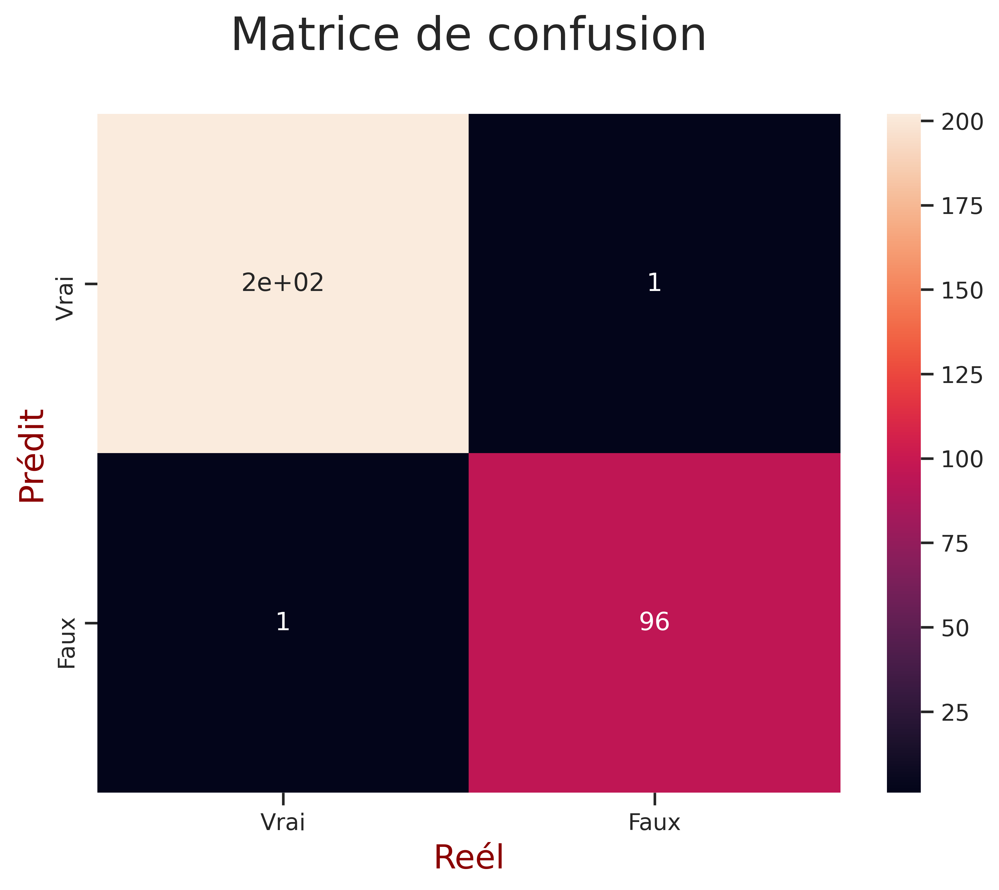

In [97]:
#Affichage avec Seaborn
fig = plt.figure(figsize=(8,6))
sns.heatmap(conf_matrix, annot=True, xticklabels=["Vrai","Faux"], yticklabels=["Vrai","Faux"])

font = {'color':  'darkred',
        'weight': 'normal',
        'size': 16,
        }

plt.xlabel("Reél", fontdict=font)
plt.ylabel("Prédit", fontdict=font)
plt.title("Matrice de confusion\n", fontsize=22)
plt.show()
#fig.savefig('graph/LOGIT_matrice_confusion.png')

#### Accuracy

Accuracy = correct predictions / total number of data points

In [98]:
# Use score method to get accuracy of model
score = lr.score(X_test, y_test)
print('Accuracy: ',round((score) * 100, 2), '%')

Accuracy:  99.33 %


# Prédiction sur un jeu de données inconnues

In [108]:
# Lire le fichier avec les données inconnues
df_inconnue = pd.read_csv('billets_test.csv', sep=',')

In [109]:
df_inconnue

,diagonal,height_left,height_right,margin_low,margin_up,length,id
0,172.09,103.95,103.73,4.39,3.09,113.19,B_1
1,171.52,104.17,104.03,5.27,3.16,111.82,B_2
2,171.78,103.80,103.75,3.81,3.24,113.39,B_3
3,172.02,104.08,103.99,5.57,3.30,111.10,B_4
4,171.79,104.34,104.37,5.00,3.07,111.87,B_5


In [110]:
#creation des variables et identifiants
X_inconnue = df_inconnue[["diagonal","height_left","height_right","margin_low","margin_up","length"]]
id_new = df_inconnue[["id"]]

In [111]:
#calcul des probabilités 
probas_inconnue = lr.predict_proba(X_inconnue)
print(probas_inconnue)

[[9.89114288e-01 1.08857123e-02]
 [9.45516446e-03 9.90544836e-01]
 [9.98990284e-01 1.00971579e-03]
 [1.94919679e-04 9.99805080e-01]
 [1.41843898e-02 9.85815610e-01]]


In [112]:
#Probalilité que le billet soit FAUX (is_genuine = 1)
prob_faux_incon = probas_inconnue[:,1]
print(prob_faux_incon)

[0.01088571 0.99054484 0.00100972 0.99980508 0.98581561]


In [113]:
#affichage du dataframe final
df_inconnue["prob_faux"] = prob_faux_incon
df_inconnue

,diagonal,height_left,height_right,margin_low,margin_up,length,id,prob_faux
0,172.09,103.95,103.73,4.39,3.09,113.19,B_1,0.010886
1,171.52,104.17,104.03,5.27,3.16,111.82,B_2,0.990545
2,171.78,103.80,103.75,3.81,3.24,113.39,B_3,0.001010
3,172.02,104.08,103.99,5.57,3.30,111.10,B_4,0.999805
4,171.79,104.34,104.37,5.00,3.07,111.87,B_5,0.985816


In [114]:
#Ajouter la variable is_genuine
df_inconnue["is_genuine"] = np.where(df_inconnue["prob_faux"]>=0.5, 'False', 'True')# > 0.5 Faux billet
df_inconnue

,diagonal,height_left,height_right,margin_low,margin_up,length,id,prob_faux,is_genuine
0,172.09,103.95,103.73,4.39,3.09,113.19,B_1,0.010886,True
1,171.52,104.17,104.03,5.27,3.16,111.82,B_2,0.990545,False
2,171.78,103.80,103.75,3.81,3.24,113.39,B_3,0.001010,True
3,172.02,104.08,103.99,5.57,3.30,111.10,B_4,0.999805,False
4,171.79,104.34,104.37,5.00,3.07,111.87,B_5,0.985816,False


In [115]:
#Recupérer les identifiants de billets identiées comme faux
results_id = df_inconnue.loc[ df_inconnue['is_genuine'] == 'False']['id']


In [116]:
print( 'Billets identifiés comme faux: ', results_id.values)

Billets identifiés comme faux:  ['B_2' 'B_4' 'B_5']


# Récommendation:



Entrainer le model avec les classes équilibrées